In [ ]:
#!pip install tensorboard
#!pip install keras-tuner -q

In [2]:
# переключиться на полуточную арифметику (float16)
import tensorflow as tf
from tensorflow.keras.mixed_precision import Policy
policy = Policy('mixed_float16')
tf.keras.mixed_precision.set_global_policy(policy)

In [2]:
# Оптимизация TensorFlow
import tensorflow as tf
tf.config.optimizer.set_jit(True)  # Включение XLA-компиляции
tf.config.threading.set_intra_op_parallelism_threads(8)
#tf.config.threading.set_inter_op_parallelism_threads(8)

# Для GPU
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
            #tf.config.experimental.set_memory_limit(gpu, 8192)  # Лимит 8GB
    except RuntimeError as e:
        print(e)

In [3]:
!nvidia-smi

Mon Oct 20 09:31:31 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 575.64.01              Driver Version: 576.80         CUDA Version: 12.9     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 4070        On  |   00000000:01:00.0  On |                  N/A |
|  0%   42C    P8             12W /  200W |    1083MiB /  12282MiB |      6%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
# как скачать датасет с Kaggle
'''
import os
import kaggle
import zipfile

# Скачаем напрямую через Kaggle API в текущую папку
dataset_name = 'bhavikjikadara/dog-and-cat-classification-dataset'
download_path = './cats_dogs_data'

print("📥 Downloading dataset...")
kaggle.api.dataset_download_files(
    dataset_name, 
    path=download_path, 
    unzip=True  # Важно: распаковываем автоматически!
)
'''

In [3]:
import os
HOME = os.getcwd()
print(HOME)

/home/oleg/projects/ML


In [4]:
# Пути
#dataset_path = "/home/oleg/projects/datasets/cats_and_dogs_filtered"
#dataset_path = "./animals"
#dataset_path = "./cars_pretrained"
dataset_path = "/home/oleg/projects/datasets/construction"
IMAGE_PATH = dataset_path
directory = dataset_path  # Используем найденный путь
os.listdir(directory)

['mining_loader',
 'bulldozer',
 'ice_rink',
 'dump_truck',
 'excavator',
 'person',
 'car',
 'truck_crane']

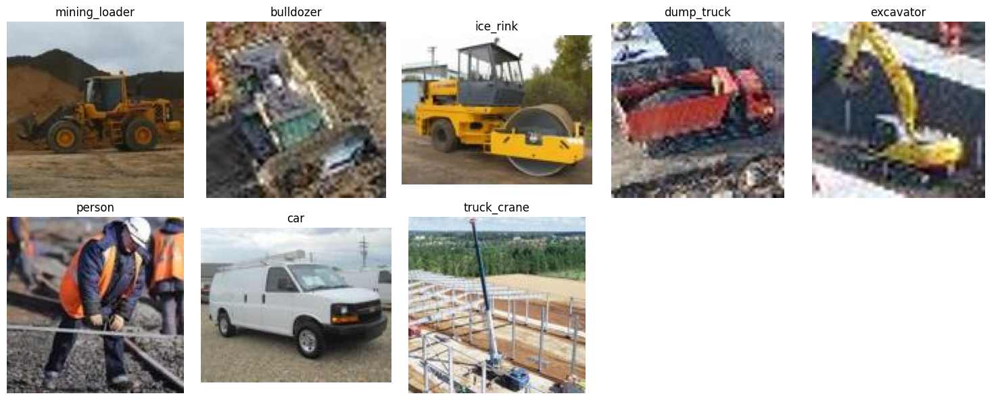

🎲 Показано по 1 случайному изображению из 8 категорий


In [6]:
# Показано по 1 случайному изображению из каждой категорий
from PIL import Image
import os
import matplotlib.pyplot as plt
import random

# Создаем график 2x5
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
axes = axes.ravel()

categories = os.listdir(IMAGE_PATH)
plot_index = 0

for category in categories:
    category_path = os.path.join(IMAGE_PATH, category)
    file_names = os.listdir(category_path)
    
    # Берем 1 случайное изображение из каждой категории
    if file_names:
        random_file = random.choice(file_names)
        img_path = os.path.join(category_path, random_file)
        img = Image.open(img_path)
        
        axes[plot_index].imshow(img)
        axes[plot_index].set_title(f"{category}", fontsize=12)
        axes[plot_index].axis('off')
        plot_index += 1

# Скрываем лишние subplot'ы
for i in range(plot_index, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

print(f"🎲 Показано по 1 случайному изображению из {plot_index} категорий")

📊 АНАЛИЗ ДАТАСЕТА:
  bulldozer: 194 файлов
  car: 1586 файлов
  dump_truck: 797 файлов
  excavator: 316 файлов
  ice_rink: 293 файлов
  mining_loader: 514 файлов
  person: 969 файлов
  truck_crane: 321 файлов
📈 ИТОГО: 4990 изображений, 8 классов


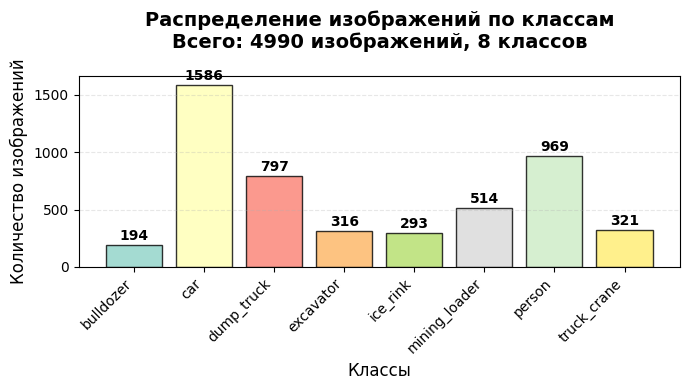

In [7]:
# Простой анализ датасета с визуализацией

import os
import matplotlib.pyplot as plt
import numpy as np

def analyze_dataset_simple(dataset_path):
    """
    Простой анализ датасета с визуализацией
    """
    # Проверяем существование пути
    if not os.path.exists(dataset_path):
        print(f"❌ Ошибка: путь '{dataset_path}' не существует")
        return None
    
    # Получаем список классов
    class_names = [d for d in os.listdir(dataset_path) 
                  if os.path.isdir(os.path.join(dataset_path, d))]
    class_names.sort()
    
    if not class_names:
        print("❌ В датасете не найдено папок с классами")
        return None
    
    # Подсчет файлов
    class_counts = {}
    total_files = 0
    
    print("📊 АНАЛИЗ ДАТАСЕТА:")
    for class_name in class_names:
        class_path = os.path.join(dataset_path, class_name)
        image_files = [f for f in os.listdir(class_path) 
                      if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]
        count = len(image_files)
        class_counts[class_name] = count
        total_files += count
        print(f"  {class_name}: {count} файлов")
    
    print(f"📈 ИТОГО: {total_files} изображений, {len(class_names)} классов")
    
    # Визуализация
    plt.figure(figsize=(7, 4))
    
    classes = list(class_counts.keys())
    counts = list(class_counts.values())
    
    # Создаем диаграмму
    bars = plt.bar(classes, counts, color=plt.cm.Set3(np.linspace(0, 1, len(classes))), 
                   edgecolor='black', alpha=0.8)
    
    # Настройки графика
    plt.title(f'Распределение изображений по классам\nВсего: {total_files} изображений, {len(class_names)} классов', 
              fontsize=14, fontweight='bold', pad=20)
    plt.xlabel('Классы', fontsize=12)
    plt.ylabel('Количество изображений', fontsize=12)
    
    # Поворачиваем подписи и выравниваем
    plt.xticks(rotation=45, ha='right')
    
    # Добавляем значения на столбцы
    for bar, count in zip(bars, counts):
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height + max(counts)*0.01,
                f'{count}', ha='center', va='bottom', fontweight='bold', fontsize=10)
    
    # Добавляем сетку для удобства чтения
    plt.grid(True, axis='y', alpha=0.3, linestyle='--')
    
    # Настраиваем отступы
    plt.tight_layout()
    
    plt.show()
    
    return {'class_names': class_names, 'class_counts': class_counts, 'total_files': total_files}

# ИСПОЛЬЗОВАНИЕ:
# Просто вызовите функцию с путем к вашему датасету
result = analyze_dataset_simple(IMAGE_PATH)

In [5]:
# МЕТКИ INTEGER

# САМЫЙ ПРОСТОЙ ВАРИАНТ - integer labels

import tensorflow as tf
from tensorflow.keras.applications.resnet50 import preprocess_input
import numpy as np
import matplotlib.pyplot as plt

height, width = 224, 224
batch_size=16

print("🔄 СОЗДАЕМ ПАЙПЛАЙН...")

# Загрузка данных (хорошо!)
train_data_raw = tf.keras.preprocessing.image_dataset_from_directory(
    IMAGE_PATH,
    validation_split=0.2,
    subset='training',
    seed=42,
    image_size=(height, width),
    batch_size=batch_size,
    shuffle=True
)

validation_data_raw = tf.keras.preprocessing.image_dataset_from_directory(
    IMAGE_PATH,
    validation_split=0.2,
    subset='validation', 
    seed=42,
    image_size=(height, width),
    batch_size=batch_size,
    shuffle=True
)

# Проверка формата (хорошо!)
images, labels = next(iter(train_data_raw))
print(f"Labels shape: {labels.shape}")  # (32,) - integer
print(f"Labels: {labels.numpy()[:15]}")  # [0, 1, 0, 2, 1]

class_names = train_data_raw.class_names
num_classes = len(class_names)
print(f"🏷️ Классы: {class_names}")

# Аугментация (хорошо!)
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.1),
    tf.keras.layers.RandomZoom(0.1),
])

# УПРОЩЕННЫЙ ПАЙПЛАЙН:
#print("🔧 СОЗДАЕМ ПРОСТОЙ ПАЙПЛАЙН...")

def preprocess_and_augment(image, label, training=False):
    """Preprocess + аугментация если training=True"""
    image = preprocess_input(tf.cast(image, tf.float32))
    if training:
        image = data_augmentation(image, training=True)
    return image, label

# Финальные datasets за 2 шага
train_data = (
    train_data_raw
    .map(lambda x, y: preprocess_and_augment(x, y, training=True),
         num_parallel_calls=tf.data.AUTOTUNE)
    .prefetch(tf.data.AUTOTUNE)
)



validation_data = (
    validation_data_raw
    .map(lambda x, y: preprocess_and_augment(x, y, training=False), 
         num_parallel_calls=tf.data.AUTOTUNE)
    .prefetch(tf.data.AUTOTUNE)
)

print("✅ Пайплайн создан!")

🔄 СОЗДАЕМ ПАЙПЛАЙН...
Found 4990 files belonging to 8 classes.
Using 3992 files for training.


I0000 00:00:1761198347.935121    1618 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9558 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4070, pci bus id: 0000:01:00.0, compute capability: 8.9


Found 4990 files belonging to 8 classes.
Using 998 files for validation.
Labels shape: (16,)
Labels: [0 1 1 5 2 4 2 6 5 0 1 3 2 1 1]
🏷️ Классы: ['bulldozer', 'car', 'dump_truck', 'excavator', 'ice_rink', 'mining_loader', 'person', 'truck_crane']
✅ Пайплайн создан!


In [21]:
# Посмотреть размер одного батча
for images, labels in train_data.take(1):
    print("Форма одного батча:", images.shape)
    print("Размер одного батча в MiB:",
          tf.size(images).numpy() * 4 / (1024 ** 2), "MiB")

Форма одного батча: (64, 224, 224, 3)
Размер одного батча в MiB: 36.75 MiB


2025-10-20 10:05:23.133558: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [10]:
# Проверим реальное состояние данных
images, labels = next(iter(train_data))
print("🔍 Реальные данные:")
print(f"  Диапазон изображений: {images.numpy().min():.3f} - {images.numpy().max():.3f}")
print(f"  Тип данных: {images.dtype}")
print(f"  Форма labels: {labels.shape}")
print(f"  Пример labels: {labels.numpy()[0]}")

🔍 Реальные данные:
  Диапазон изображений: -123.680 - 151.061
  Тип данных: <dtype: 'float32'>
  Форма labels: (32,)
  Пример labels: 7


2025-10-20 09:35:29.941849: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: CANCELLED: RecvAsync is cancelled.
	 [[{{node cluster_1_1/merge_oidx_0/_4}}]] [type.googleapis.com/tensorflow.DerivedStatus='']
2025-10-20 09:35:29.941937: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 15042259098739683458
2025-10-20 09:35:29.941950: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 12083301294123617632
2025-10-20 09:35:29.941955: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 696649002514806253
2025-10-20 09:35:29.941964: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 13686941147090089485
2025-10-20 09:35:29.941969: I tensorflow/core/framework/local_rendezvous.cc:426] Local rendezvous recv item cancelled. Key hash: 1108924924833027753
20

🎨 ВИЗУАЛИЗАЦИЯ (1 пример на класс):
📊 Распределение в тренировочных данных:


2025-10-20 09:38:44.938804: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


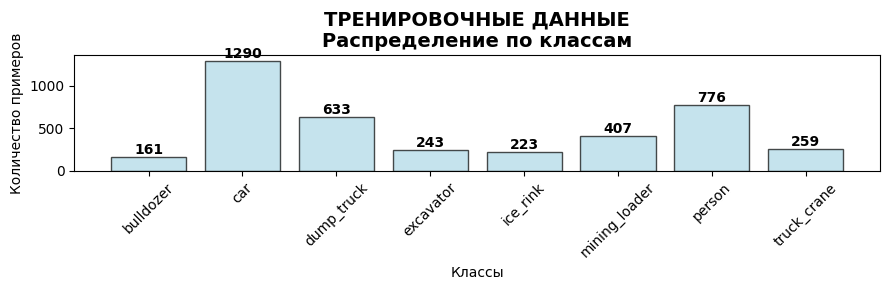

📊 Распределение в валидационных данных:


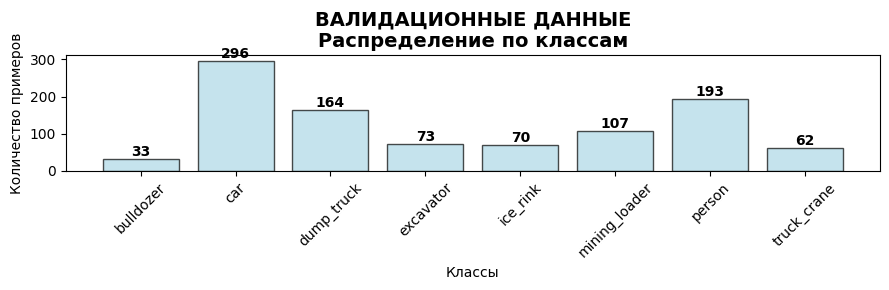


🖼️ По одному примеру на класс (тренировка):


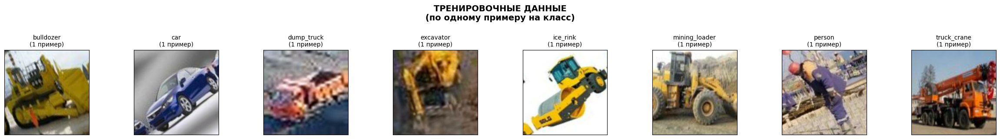


🖼️ По одному примеру на класс (валидация):


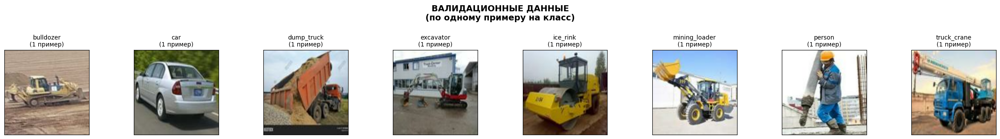

In [11]:
def visualize_single_example_per_class(dataset, class_names, title=""):
    """
    Визуализация по одному примеру для каждого класса
    """
    # Собираем все изображения и метки
    all_images = []
    all_labels = []
    
    for images, labels in dataset.take(10):  # Берем несколько батчей
        all_images.append(images.numpy())
        all_labels.append(labels.numpy())
    
    all_images = np.concatenate(all_images, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)
    
    # Создаем сетку для визуализации
    cols = len(class_names)
    fig, axes = plt.subplots(1, cols, figsize=(3*cols, 3))
    
    if cols == 1:
        axes = [axes]
    
    fig.suptitle(f'{title}\n(по одному примеру на класс)', fontsize=14, fontweight='bold', y=1.05)
    
    for class_idx, class_name in enumerate(class_names):
        ax = axes[class_idx]
        
        # Находим первый пример этого класса
        class_mask = all_labels == class_idx
        class_examples = all_images[class_mask]
        
        if len(class_examples) > 0:
            # Берем первый пример класса
            image = class_examples[0].copy()
            
            # Восстанавливаем оригинальные цвета
            image[..., 0] += 103.939  # B
            image[..., 1] += 116.779  # G
            image[..., 2] += 123.68   # R
            image = np.clip(image, 0, 255).astype('uint8')
            image = image[..., ::-1]  # BGR → RGB
            
            ax.imshow(image)
            ax.set_title(f'{class_name}\n(1 пример)', fontsize=10)
        else:
            ax.imshow(np.zeros((224, 224, 3)))
            ax.set_title(f'{class_name}\n(нет примеров)', fontsize=10)
            ax.text(0.5, 0.5, 'Нет примеров', 
                   ha='center', va='center', 
                   transform=ax.transAxes, fontsize=8)
        
        ax.set_xticks([])
        ax.set_yticks([])
        ax.grid(False)
    
    plt.tight_layout()
    plt.show()

# БЫСТРАЯ версия распределения
def visualize_class_distribution_simple(dataset, class_names, title=""):
    """
    Упрощенная визуализация распределения классов
    """
    # Считаем количество примеров по классам
    class_counts = {name: 0 for name in class_names}
    
    for images, labels in dataset:
        for label in labels.numpy():
            class_counts[class_names[label]] += 1
    
    # Визуализация
    plt.figure(figsize=(9, 3))
    
    classes = list(class_counts.keys())
    counts = list(class_counts.values())
    
    bars = plt.bar(classes, counts, color='lightblue', edgecolor='black', alpha=0.7)
    plt.title(f'{title}\nРаспределение по классам', fontsize=14, fontweight='bold')
    plt.xlabel('Классы')
    plt.ylabel('Количество примеров')
    plt.xticks(rotation=45)
    
    # Добавляем значения на столбцы
    for bar, count in zip(bars, counts):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.1,
                f'{count}', ha='center', va='bottom', fontweight='bold')
    
    plt.tight_layout()
    plt.show()
    
    return class_counts

# Тестируем упрощенную версию
print("🎨 ВИЗУАЛИЗАЦИЯ (1 пример на класс):")
print("📊 Распределение в тренировочных данных:")
train_counts = visualize_class_distribution_simple(train_data, class_names, "ТРЕНИРОВОЧНЫЕ ДАННЫЕ")

print("📊 Распределение в валидационных данных:")
val_counts = visualize_class_distribution_simple(validation_data, class_names, "ВАЛИДАЦИОННЫЕ ДАННЫЕ")

print("\n🖼️ По одному примеру на класс (тренировка):")
visualize_single_example_per_class(train_data, class_names, "ТРЕНИРОВОЧНЫЕ ДАННЫЕ")

print("\n🖼️ По одному примеру на класс (валидация):")
visualize_single_example_per_class(validation_data, class_names, "ВАЛИДАЦИОННЫЕ ДАННЫЕ")

In [6]:
# Создание модели

import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras import layers, Model
from tensorflow.keras import layers
from tensorflow.keras.layers import GlobalAveragePooling2D, GlobalMaxPooling2D, Concatenate, Dense, Dropout, BatchNormalization, Activation
from tensorflow.keras.regularizers import l1, l2, l1_l2

# Удаляем старую модель
#del model

height, width = 224, 224

# 1. Базовая модель
base_model = ResNet50(
    weights='imagenet',      # ✅ Предобученные веса
    include_top=False,       # ✅ Убираем старый классификатор
    input_shape=(height, width, 3) # ✅ Ваш размер изображений <-
)
base_model.trainable = False # ✅ Замораживаем веса ResNet

# 2. Functional API с training=False
inputs = tf.keras.Input(shape=(height, width, 3)) # <-
# ↓↓↓ ВСТАВЬТЕ PREPROCESS_INPUT ЗДЕСЬ ↓↓↓
# x = tf.keras.layers.Lambda(preprocess_input)(inputs)  # ← ВОТ ТУТ!
# ↑↑↑ ВСТАВЬТЕ PREPROCESS_INPUT ЗДЕСЬ ↑↑↑
x = base_model(inputs, training=False)  # ✅ BatchNorm в inference режиме


'''
# 98.096
# Плато после 35
x = layers.GlobalAveragePooling2D()(x)  # ✅ Преобразует 4D → 1D
x = layers.Dense(128, activation='relu')(x) # Выделяет сложные признаки из сжатых данных"
x = layers.Dropout(0.3)(x)               # ✅ Предотвращает переобучение, делает модель более robust" 
x = layers.Dense(64, activation='relu')(x) # Дальнейшее выделение признаков перед классификацией"
x = layers.Dropout(0.2)(x)
'''
'''
# 97.495
# Плато после 19
x = layers.GlobalAveragePooling2D()(x)  # ✅ Преобразует 4D → 1D
x = layers.Dense(128, activation='relu')(x) # Выделяет сложные признаки из сжатых данных"
x = layers.Dropout(0.5)(x)               # ✅ Предотвращает переобучение, делает модель более robust" 
x = layers.Dense(64, activation='relu')(x) # Дальнейшее выделение признаков перед классификацией"
x = layers.Dropout(0.2)(x)
'''

'''
# 97.796
# Плато после 35
x = layers.GlobalAveragePooling2D()(x)  # ✅ Преобразует 4D → 1D
x = layers.Dense(128, activation='relu')(x) # Выделяет сложные признаки из сжатых данных"
x = layers.Dropout(0.7)(x)               # ✅ Предотвращает переобучение, делает модель более robust" 
x = layers.Dense(64, activation='relu')(x) # Дальнейшее выделение признаков перед классификацией"
x = layers.Dropout(0.2)(x)
'''
'''
''
# 94.389
# Плато после 34
x = layers.GlobalAveragePooling2D()(x)  # ✅ Преобразует 4D → 1D
x = layers.Dense(128, activation='relu')(x) # Выделяет сложные признаки из сжатых данных"
x = layers.Dropout(0.7)(x)               # ✅ Предотвращает переобучение, делает модель более robust" 
x = layers.Dense(64, activation='relu')(x) # Дальнейшее выделение признаков перед классификацией"
x = layers.Dropout(0.4)(x)
'''

'''
# 97.796
# Плато после 20
x = layers.GlobalAveragePooling2D()(x)  # ✅ Преобразует 4D → 1D
x = layers.Dense(256, activation='relu')(x) # Выделяет сложные признаки из сжатых данных"
x = layers.Dropout(0.3)(x)               # ✅ Предотвращает переобучение, делает модель более robust" 
x = layers.Dense(64, activation='relu')(x) # Дальнейшее выделение признаков перед классификацией"
x = layers.Dropout(0.2)(x)
'''



# # 3. Классификатор
# x = layers.GlobalAveragePooling2D()(x)
# x = layers.Dense(256, activation='relu')(x)
# x = layers.Dropout(0.5)(x)      # ↑ Увеличили
# x = layers.Dense(128, activation='relu')(x) 
# x = layers.Dropout(0.3)(x)      # ↑ Увеличили

# Хорошо
# x = layers.GlobalAveragePooling2D()(x)
# x = layers.Dense(256, activation='relu')(x)
# x = layers.Dropout(0.6)(x)      # ↑ Было 0.5 → Стало 0.6
# x = layers.Dense(128, activation='relu')(x) 
# x = layers.Dropout(0.4)(x)      # ↑ Было 0.3 → Стало 0.4

# норм
#from tensorflow.keras.regularizers import l2
#from tensorflow.keras.layers import Dense, Dropout

'''
# 97.495
# после 12 плато
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu', kernel_regularizer=l2(0.001))(x)
x = Dropout(0.7)(x)
x = Dense(64, activation='relu', kernel_regularizer=l2(0.001))(x) 
x = Dropout(0.3)(x)
'''


'''
# 97.49
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu', kernel_regularizer=l2(0.0001))(x)
x = Dropout(0.7)(x)
x = Dense(128, activation='relu', kernel_regularizer=l2(0.001))(x) 
x = Dropout(0.4)(x)
'''



# 98.397
x = layers.GlobalAveragePooling2D()(x)
x = layers.BatchNormalization()(x)  # ⬅️ Добавляем BatchNorm
x = layers.Dense(1024, activation='relu')(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.4)(x)
x = layers.Dense(512, activation='relu')(x) 
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.3)(x)


'''
# 97.996
x = layers.GlobalAveragePooling2D()(x)
x = layers.BatchNormalization()(x)  # ⬅️ Добавляем BatchNorm
x = layers.Dense(512, activation='relu')(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.7)(x)
x = layers.Dense(128, activation='relu')(x) 
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.4)(x)
'''

# Хорошо v2 (лучше)
# x = layers.GlobalAveragePooling2D()(x)
# x = layers.Dense(512, activation='relu')(x)  # ↑ Увеличить capacity
# x = layers.Dropout(0.7)(x)                   # ↑ Сильная регуляризация
# x = layers.Dense(64, activation='relu')(x)   # ↓ Уменьшить второй слой
# x = layers.Dropout(0.3)(x)

# # хуже хорошего
# x = GlobalMaxPooling2D()(x)      # Берет максимум вместо среднего
# x = layers.Dense(128, activation='relu')(x)  # ↑ Увеличить capacity
# x = layers.Dropout(0.7)(x)                   # ↑ Сильная регуляризация
# x = layers.Dense(64, activation='relu')(x)   # ↓ Уменьшить второй слой
# x = layers.Dropout(0.3)(x)

# # Попробуйте:
# x = GlobalMaxPooling2D()(x)      # Берет максимум вместо среднего
# x = layers.Dense(512, activation='relu')(x)  # ↑ Увеличить capacity
# x = layers.Dropout(0.7)(x)                   # ↑ Сильная регуляризация
# x = layers.Dense(64, activation='relu')(x)   # ↓ Уменьшить второй слой
# x = layers.Dropout(0.3)(x)

# 3. Классификатор
# x = layers.GlobalAveragePooling2D()(x)  # ✅ Преобразует 4D → 1D
# x = layers.Dense(256, activation='relu')(x) # Выделяет сложные признаки из сжатых данных"
# x = layers.Dropout(0.3)(x)               # ✅ Предотвращает переобучение, делает модель более robust" 
# x = layers.Dense(128, activation='relu')(x) # Дальнейшее выделение признаков перед классификацией"
# x = layers.Dropout(0.2)(x)                 # Постепенное уменьшение регуляризации к выходу"

# Выходной слой для 2 классов
#outputs = layers.Dense(2, activation='softmax')(x)  # ✅ 2 класса
# ВАЖНО: выходной слой с num_classes нейронами!
outputs = layers.Dense(num_classes, activation='softmax')(x)  # ← АВТОМАТИЧЕСКИ!

# 4. Сборка и компиляция
model = Model(inputs, outputs) # <-
model.compile(
    optimizer='adam',
    #loss='categorical_crossentropy',  # ✅ Для categorical меток
    loss='sparse_categorical_crossentropy',  # ← ДЛЯ INTEGER LABELS
    metrics=['accuracy']
)

print("✅ Модель создана для {} классов!".format(num_classes))
#model.summary()
print("✅ Transfer Learning модель готова!")
print("🎯 ResNet50 заморожена, обучаться будут только добавленные Dense слои")
model.summary()

✅ Модель создана для 8 классов!
✅ Transfer Learning модель готова!
🎯 ResNet50 заморожена, обучаться будут только добавленные Dense слои


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 2048)           │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1024)           │     2,098,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 8)              │         4,104 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 26,229,128 (100.06 MB)

 Trainable params: 2,634,248 (10.05 MB)

 Non-trainable params: 23,594,880 (90.01 MB)

In [7]:
# Полный код для вашего случая
import datetime
import os

from tensorflow.keras.callbacks import TensorBoard, EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

#from datetime import datetime

#from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping, ReduceLROnPlateau  # ← ДОБАВЬ ЭТО

# 1. Создаем папку для логов
log_dir = os.path.join("logs", "fit", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
os.makedirs(log_dir, exist_ok=True)

# 2. Создаем callback
tensorboard_callback = TensorBoard(
    log_dir=log_dir,
    #histogram_freq=1,
    histogram_freq=0,      # ⬅️ Без гистограмм
    #write_graph=True,
    write_graph=False,     # ⬅️ Без графа модели (экономит память)
    write_images=False,  # Можно отключить для экономии места
    profile_batch=0,        # ⬅️ Без профилирования
    update_freq='epoch'
)

# 3. Добавляем в обучение
callbacks = [
    #EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1),
    EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True, verbose=1), # monitor='val_loss',  # ⬅️ Следим за loss (может быть стабильнее)
    ModelCheckpoint('best_model_keras.keras', monitor='val_accuracy', save_best_only=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', patience=5, factor=0.5, verbose=1),
    #tensorboard_callback
]

print(f"📊 TensorBoard логи будут сохранены в: {log_dir}")

📊 TensorBoard логи будут сохранены в: logs/fit/20251023-084814


In [8]:
# 4. Запускаем обучение
history = model.fit(
    train_data,
    epochs=10,
    validation_data=validation_data,
    callbacks=callbacks,
    verbose=1
)

# 5. После обучения запускаем TensorBoard
print("\n🎯 Для просмотра TensorBoard выполните:")
print("!tensorboard --logdir logs/fit")
print("И откройте http://localhost:6006/")

Epoch 1/10


I0000 00:00:1761198508.423282    1720 service.cc:152] XLA service 0x77eff4001700 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1761198508.423330    1720 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 4070, Compute Capability 8.9
I0000 00:00:1761198508.451343    1720 cuda_dnn.cc:529] Loaded cuDNN version 91400
I0000 00:00:1761198508.548641    1720 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
2025-10-23 08:48:30.653950: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.


250/250 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.7795 - loss: 0.7633
Epoch 1: val_accuracy improved from None to 0.94790, saving model to best_model_keras.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - accuracy: 0.8407 - loss: 0.5597 - val_accuracy: 0.9479 - val_loss: 0.1650 - learning_rate: 0.0010
Epoch 2/10
151/250 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - accuracy: 0.9008 - loss: 0.3051
Epoch 2: val_accuracy improved from 0.94790 to 0.96493, saving model to best_model_keras.keras
250/250 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - accuracy: 0.9061 - loss: 0.2974 - val_accuracy: 0.9649 - val_loss: 0.1314 - learning_rate: 0.0010
Epoch 3/10
249/250 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.9188 - loss: 0.2353
Epoch 3: val_accuracy did not improve from 0.96493
250/250 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - accuracy: 0.9216 - loss: 0.2342 - val_accuracy: 0.9599 - val_loss: 0.1391 - learning_rate: 0.0010
Epoch 4/10
249/250 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - accuracy: 0.9368 - loss: 0.206

In [29]:
!tensorboard --logdir logs/fit

/home/oleg/miniconda3/envs/TF/lib/python3.10/site-packages/tensorboard/default.py:30: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources

NOTE: Using experimental fast data loading logic. To disable, pass
    "--load_fast=false" and report issues on GitHub. More details:
    https://github.com/tensorflow/tensorboard/issues/4784

Serving TensorBoard on localhost; to expose to the network, use a proxy or pass --bind_all
TensorBoard 2.20.0 at http://localhost:6006/ (Press CTRL+C to quit)
^C


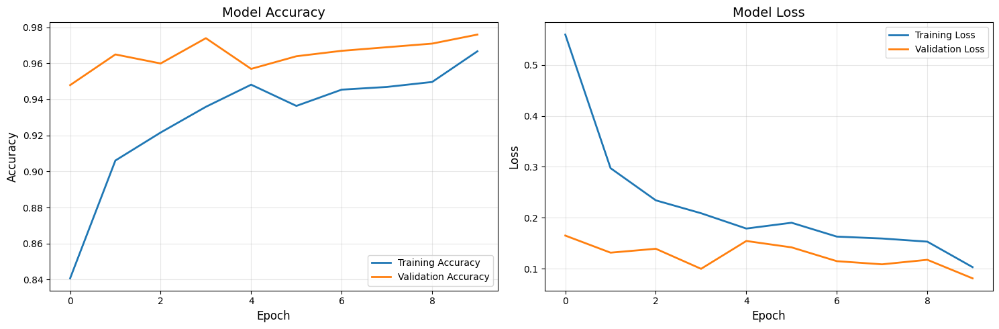

In [9]:
# Визуализация результатов

import matplotlib.pyplot as plt
import numpy as np

def plot_training_history(history):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
    
    # График точности
    ax1.plot(history.history['accuracy'], label='Training Accuracy', linewidth=2)
    ax1.plot(history.history['val_accuracy'], label='Validation Accuracy', linewidth=2)
    ax1.set_title('Model Accuracy', fontsize=14)
    ax1.set_xlabel('Epoch', fontsize=12)
    ax1.set_ylabel('Accuracy', fontsize=12)
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # График потерь
    ax2.plot(history.history['loss'], label='Training Loss', linewidth=2)
    ax2.plot(history.history['val_loss'], label='Validation Loss', linewidth=2)
    ax2.set_title('Model Loss', fontsize=14)
    ax2.set_xlabel('Epoch', fontsize=12)
    ax2.set_ylabel('Loss', fontsize=12)
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

# Построим графики
plot_training_history(history)

🚀 ЗАПУСК CONFUSION MATRIX АНАЛИЗА...
📊 ЗАПУСКАЕМ CONFUSION MATRIX АНАЛИЗ...
🔄 Получаем предсказания...
🔄 Собираем предсказания и метки...
📦 Обработано батчей: 10
📦 Обработано батчей: 20
📦 Обработано батчей: 30
📦 Обработано батчей: 40
📦 Обработано батчей: 50
📦 Обработано батчей: 60


2025-10-23 08:53:32.369984: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


✅ Собрано 998 предсказаний
🔢 Уникальные истинные классы: [0 1 2 3 4 5 6 7]
🔢 Уникальные предсказанные классы: [0 1 2 3 4 5 6 7]
📋 Присутствующие классы: ['bulldozer', 'car', 'dump_truck', 'excavator', 'ice_rink', 'mining_loader', 'person', 'truck_crane']
📏 Confusion matrix shape: (8, 8)


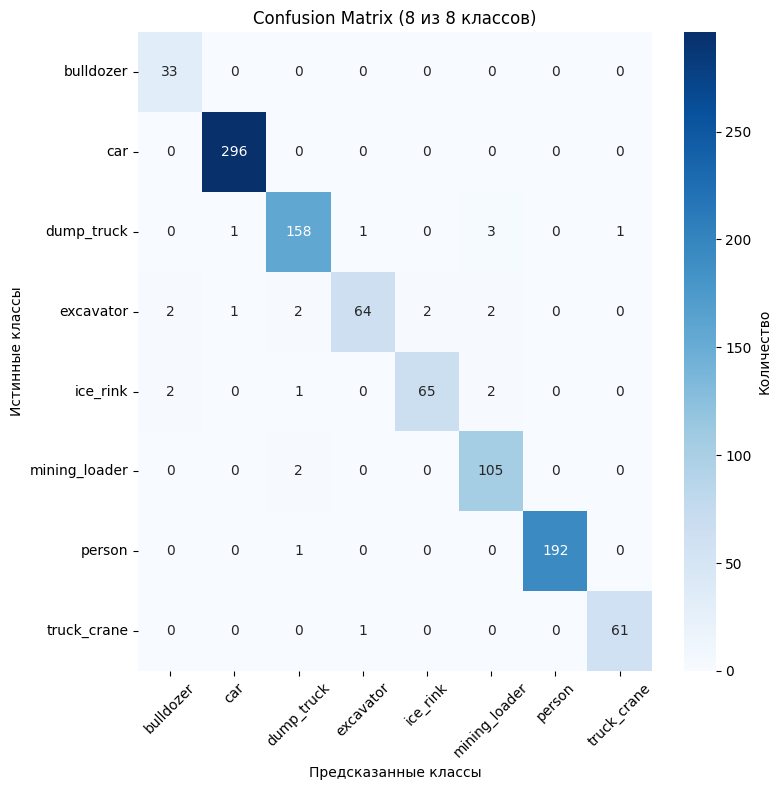


📈 ДЕТАЛЬНАЯ СТАТИСТИКА:
Всего примеров: 998
Общая точность: 0.9760

🎯 ТОЧНОСТЬ ПО КЛАССАМ:
  bulldozer: 1.0000 (33/33)
  car: 1.0000 (296/296)
  dump_truck: 0.9634 (158/164)
  excavator: 0.8767 (64/73)
  ice_rink: 0.9286 (65/70)
  mining_loader: 0.9813 (105/107)
  person: 0.9948 (192/193)
  truck_crane: 0.9839 (61/62)

📊 CLASSIFICATION REPORT:
               precision    recall  f1-score   support

    bulldozer     0.8919    1.0000    0.9429        33
          car     0.9933    1.0000    0.9966       296
   dump_truck     0.9634    0.9634    0.9634       164
    excavator     0.9697    0.8767    0.9209        73
     ice_rink     0.9701    0.9286    0.9489        70
mining_loader     0.9375    0.9813    0.9589       107
       person     1.0000    0.9948    0.9974       193
  truck_crane     0.9839    0.9839    0.9839        62

     accuracy                         0.9760       998
    macro avg     0.9637    0.9661    0.9641       998
 weighted avg     0.9764    0.9760    0.9758  

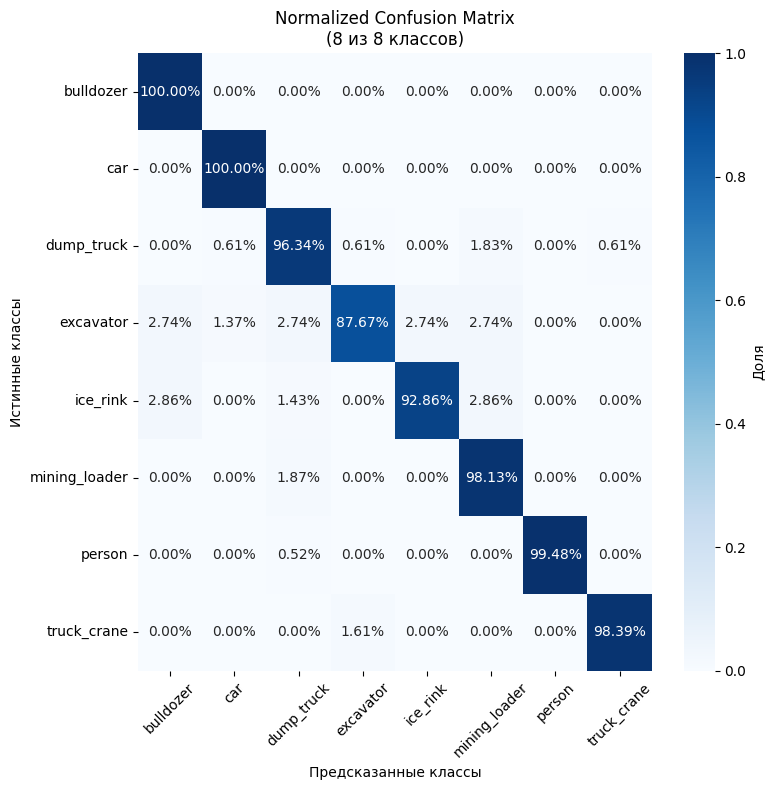

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
import tensorflow as tf

'''
Синие тона:
cmap='Blues' # твой текущий
cmap='viridis' 
cmap='coolwarm'
cmap='icefire'

Зеленые тона:
cmap='Greens'
cmap='viridis'
cmap='summer'

Красные/оранжевые:
cmap='Reds'
cmap='Oranges'
cmap='YlOrBr'  
cmap='hot'

Фиолетовые:
cmap='Purples'
cmap='magma'
cmap='plasma'
'''


def get_all_predictions_modern(model, dataset):
    """Получает все предсказания и метки из датасета"""
    print("🔄 Собираем предсказания и метки...")
    
    all_preds = []
    all_true_labels = []
    
    # Проходим по всем батчам датасета
    for batch_idx, (images, labels) in enumerate(dataset):
        # Получаем предсказания для текущего батча
        batch_preds = model.predict(images, verbose=0)
        all_preds.append(batch_preds)
        all_true_labels.append(labels.numpy())
        
        # Прогресс каждые 10 батчей
        if (batch_idx + 1) % 10 == 0:
            print(f"📦 Обработано батчей: {batch_idx + 1}")
    
    # Объединяем все батчи
    all_preds = np.concatenate(all_preds, axis=0)
    all_true_labels = np.concatenate(all_true_labels, axis=0)
    
    print(f"✅ Собрано {len(all_preds)} предсказаний")
    return all_preds, all_true_labels

def safe_confusion_matrix_analysis(model, dataset, class_names):
    """Безопасный анализ confusion matrix с автоматической обработкой отсутствующих классов"""
    print("📊 ЗАПУСКАЕМ CONFUSION MATRIX АНАЛИЗ...")
    
    # Получаем предсказания
    print("🔄 Получаем предсказания...")
    preds, true_labels = get_all_predictions_modern(model, dataset)
    
    # Для sparse categorical - метки уже целые числа, не нужно argmax
    if len(true_labels.shape) == 1:  # sparse labels [0, 1, 2, ...]
        true_classes = true_labels
    else:  # one-hot encoded labels
        true_classes = np.argmax(true_labels, axis=1)
    
    preds_classes = np.argmax(preds, axis=1)
    
    # Находим какие классы реально присутствуют в данных
    present_true_classes = np.unique(true_classes)
    present_pred_classes = np.unique(preds_classes)
    
    print(f"🔢 Уникальные истинные классы: {present_true_classes}")
    print(f"🔢 Уникальные предсказанные классы: {present_pred_classes}")
    
    # Определяем какие классы из class_names реально присутствуют
    present_class_indices = sorted(present_true_classes)
    present_class_names = [class_names[i] for i in present_class_indices]
    
    print(f"📋 Присутствующие классы: {present_class_names}")
    
    absent_classes = [class_names[i] for i in range(len(class_names)) if i not in present_true_classes]
    if absent_classes:
        print(f"❌ Отсутствующие классы: {absent_classes}")
    
    # Создаем confusion matrix только для присутствующих классов
    cm = confusion_matrix(true_classes, preds_classes, labels=present_class_indices)
    
    print(f"📏 Confusion matrix shape: {cm.shape}")
    
    # Визуализируем
    plt.figure(figsize=(max(8, len(present_class_names)), max(6, len(present_class_names))))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=present_class_names, 
                yticklabels=present_class_names,
                cbar_kws={'label': 'Количество'})
    plt.xlabel('Предсказанные классы')
    plt.ylabel('Истинные классы')
    plt.title(f'Confusion Matrix ({len(present_class_names)} из {len(class_names)} классов)')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()
    
    # Статистика
    total_samples = len(true_classes)
    accuracy = np.sum(preds_classes == true_classes) / total_samples
    
    print(f"\n📈 ДЕТАЛЬНАЯ СТАТИСТИКА:")
    print(f"Всего примеров: {total_samples}")
    print(f"Общая точность: {accuracy:.4f}")
    
    print(f"\n🎯 ТОЧНОСТЬ ПО КЛАССАМ:")
    for i, class_idx in enumerate(present_class_indices):
        class_name = class_names[class_idx]
        correct = cm[i, i]
        total = np.sum(cm[i, :])
        accuracy = correct / total if total > 0 else 0
        print(f"  {class_name}: {accuracy:.4f} ({correct}/{total})")
    
    # Для отсутствующих классов
    if absent_classes:
        print(f"\n❌ ОТСУТСТВУЮЩИЕ КЛАССЫ В ВАЛИДАЦИИ:")
        for class_name in absent_classes:
            print(f"  {class_name}: 0 примеров")
    
    # Classification report только для присутствующих классов
    print(f"\n📊 CLASSIFICATION REPORT:")
    print(classification_report(true_classes, preds_classes, 
                              labels=present_class_indices,
                              target_names=present_class_names, 
                              digits=4))
    
    # Нормализованная confusion matrix
    plt.figure(figsize=(max(8, len(present_class_names)), max(6, len(present_class_names))))
    cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    cm_normalized = np.nan_to_num(cm_normalized)  # Заменяем NaN на 0
    
    sns.heatmap(cm_normalized, annot=True, fmt='.2%', cmap='Blues',
                xticklabels=present_class_names, 
                yticklabels=present_class_names,
                cbar_kws={'label': 'Доля'})
    plt.xlabel('Предсказанные классы')
    plt.ylabel('Истинные классы')
    plt.title(f'Normalized Confusion Matrix\n({len(present_class_names)} из {len(class_names)} классов)')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()
    
    return cm, present_class_names

# 🎯 ЗАПУСКАЕМ АНАЛИЗ
print("🚀 ЗАПУСК CONFUSION MATRIX АНАЛИЗА...")
cm, present_classes = safe_confusion_matrix_analysis(model, validation_data, class_names)

🎲 Тестирование случайных примеров...


2025-10-23 08:53:44.094424: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


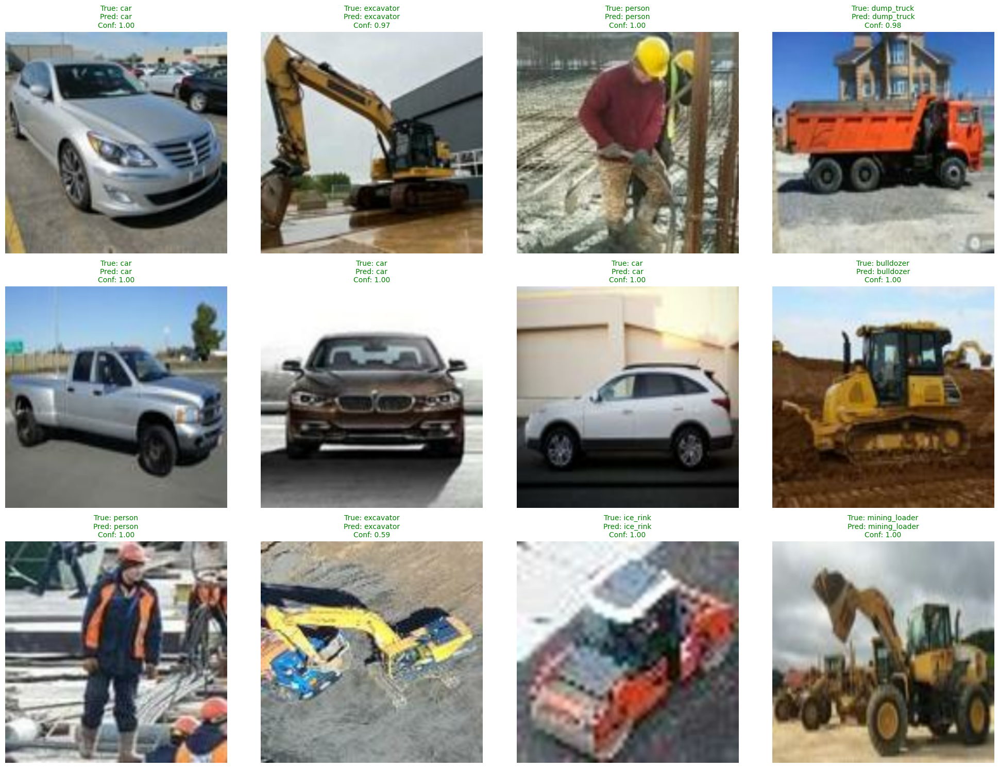

📊 Точность на 12 случайных примерах: 12/12 (100.0%)


In [13]:
# рандом ВЕРСИЯ ДЛЯ SPARSE LABELS 

def test_random_predictions_modern(model, dataset, class_names, num_samples=12):
    """
    Тестирование случайных примеров из всего датасета
    ВЕРСИЯ ДЛЯ SPARSE LABELS (целочисленные метки)
    """
    # Собираем все изображения и метки
    all_images = []
    all_labels = []
    
    for images, labels in dataset:
        all_images.append(images.numpy())
        all_labels.append(labels.numpy())
    
    # Объединяем все батчи
    all_images = np.concatenate(all_images, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)
    
    # Выбираем случайные индексы
    total_samples = len(all_images)
    indices = np.random.choice(total_samples, min(num_samples, total_samples), replace=False)
    
    selected_images = all_images[indices]
    selected_labels = all_labels[indices]
    
    # Предсказания
    predictions = model.predict(selected_images, verbose=0)
    predicted_classes = np.argmax(predictions, axis=1)
    
    # ДЛЯ SPARSE LABELS - просто используем как есть, без argmax!
    true_classes = selected_labels  # ← ИСПРАВЛЕНИЕ ЗДЕСЬ
    
    # Создаем сетку
    cols = 4
    rows = (num_samples + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
    
    if rows == 1:
        axes = axes.reshape(1, -1)
    elif rows > 1 and cols == 1:
        axes = axes.reshape(-1, 1)
    
    correct = 0
    for i, idx in enumerate(indices):
        if rows == 1:
            ax = axes[col] if cols > 1 else axes
        else:
            row_idx = i // cols
            col_idx = i % cols
            ax = axes[row_idx, col_idx]
        
        # Денормализация для ResNet50
        image = selected_images[i].copy()
        image[..., 0] += 103.939
        image[..., 1] += 116.779  
        image[..., 2] += 123.68
        image = np.clip(image, 0, 255).astype('uint8')
        image = image[..., ::-1]  # BGR to RGB
        
        ax.imshow(image)
        
        true_class = class_names[true_classes[i]]
        pred_class = class_names[predicted_classes[i]]
        confidence = np.max(predictions[i])
        
        color = 'green' if true_class == pred_class else 'red'
        if true_class == pred_class:
            correct += 1
            
        ax.set_title(f"True: {true_class}\nPred: {pred_class}\nConf: {confidence:.2f}", 
                    color=color, fontsize=10)
        ax.axis('off')
    
    # Скрываем пустые оси
    for i in range(len(indices), rows * cols):
        if rows == 1:
            if cols > 1:
                axes[i].axis('off')
        else:
            row_idx = i // cols
            col_idx = i % cols
            axes[row_idx, col_idx].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    accuracy = correct / len(indices) * 100
    print(f"📊 Точность на {len(indices)} случайных примерах: {correct}/{len(indices)} ({accuracy:.1f}%)")
    
    return correct, accuracy

# Использование случайных примеров:
print("🎲 Тестирование случайных примеров...")
correct, accuracy = test_random_predictions_modern(model, validation_data, class_names, num_samples=12)

🎲 Тестирование случайных примеров (универсальная версия)...
🔍 Обнаружен формат меток: SPARSE


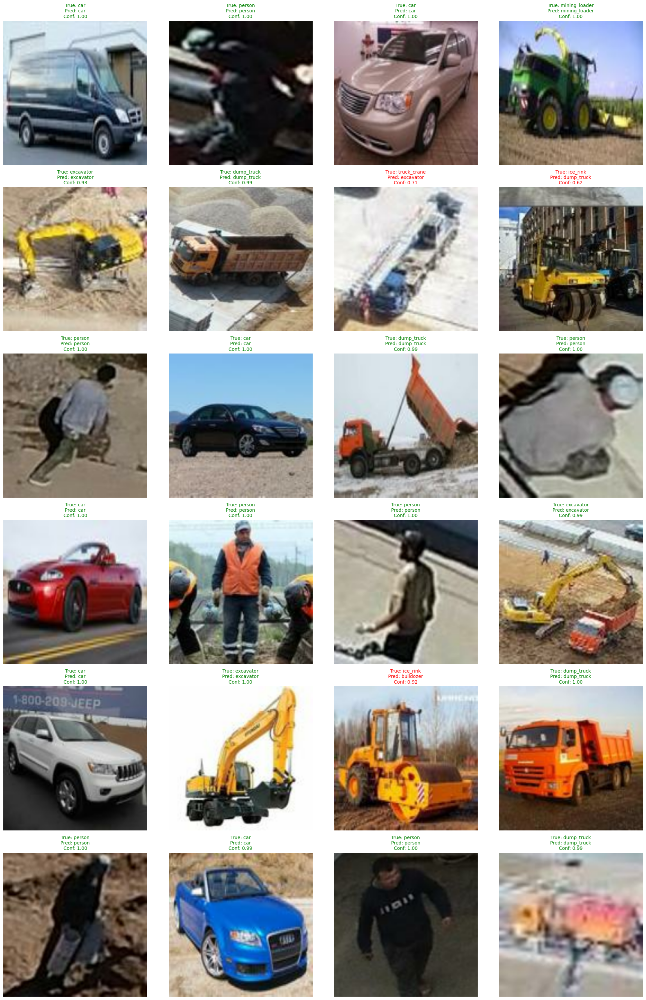

📊 Точность на 24 случайных примерах: 21/24 (87.5%)
🎯 Формат меток: SPARSE


In [14]:
# рандом УНИВЕРСАЛЬНАЯ ВЕРСИЯ (работает с любым форматом)

def test_random_predictions_universal(model, dataset, class_names, num_samples=12):
    """
    Универсальная версия для любого формата меток
    """
    # Собираем все изображения и метки
    all_images = []
    all_labels = []
    
    for images, labels in dataset:
        all_images.append(images.numpy())
        all_labels.append(labels.numpy())
    
    all_images = np.concatenate(all_images, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)
    
    # Выбираем случайные индексы
    total_samples = len(all_images)
    indices = np.random.choice(total_samples, min(num_samples, total_samples), replace=False)
    
    selected_images = all_images[indices]
    selected_labels = all_labels[indices]
    
    # Предсказания
    predictions = model.predict(selected_images, verbose=0)
    predicted_classes = np.argmax(predictions, axis=1)
    
    # АВТОМАТИЧЕСКОЕ ОПРЕДЕЛЕНИЕ ФОРМАТА МЕТОК
    if len(selected_labels.shape) == 1:  # SPARSE labels
        true_classes = selected_labels
        label_format = "SPARSE"
    else:  # ONE-HOT labels
        true_classes = np.argmax(selected_labels, axis=1)
        label_format = "ONE-HOT"
    
    print(f"🔍 Обнаружен формат меток: {label_format}")
    
    # Создаем сетку
    cols = 4
    rows = (len(indices) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows))
    
    if rows == 1:
        axes = axes.reshape(1, -1)
    
    correct = 0
    for i, idx in enumerate(indices):
        row = i // cols
        col = i % cols
        ax = axes[row, col] if rows > 1 else axes[col]
        
        # Умная денормализация
        image = selected_images[i].copy()
        
        # Автоматическое определение диапазона
        if image.min() >= -1 and image.max() <= 1:
            image = (image + 1) * 127.5
        elif image.min() >= 0 and image.max() <= 1:
            image = image * 255
        else:
            # ImageNet нормализация
            image[..., 0] += 103.939
            image[..., 1] += 116.779  
            image[..., 2] += 123.68
        
        image = np.clip(image, 0, 255).astype('uint8')
        image = image[..., ::-1]  # BGR to RGB
        
        ax.imshow(image)
        
        true_class = class_names[true_classes[i]]
        pred_class = class_names[predicted_classes[i]]
        confidence = np.max(predictions[i])
        
        color = 'green' if true_class == pred_class else 'red'
        if true_class == pred_class:
            correct += 1
            
        ax.set_title(f"True: {true_class}\nPred: {pred_class}\nConf: {confidence:.2f}", 
                    color=color, fontsize=10)
        ax.axis('off')
    
    # Скрываем пустые оси
    for i in range(len(indices), rows * cols):
        row = i // cols
        col = i % cols
        if rows > 1:
            axes[row, col].axis('off')
        else:
            axes[col].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    accuracy = correct / len(indices) * 100
    print(f"📊 Точность на {len(indices)} случайных примерах: {correct}/{len(indices)} ({accuracy:.1f}%)")
    print(f"🎯 Формат меток: {label_format}")
    
    return correct, accuracy

# Тестируем универсальную версию
print("🎲 Тестирование случайных примеров (универсальная версия)...")
correct, accuracy = test_random_predictions_universal(model, validation_data, class_names, num_samples=24)

In [ ]:
# Сохраните модель

# Сохраняем обученную модель
model.save('cats_dogs_classifier.h5')
print("💾 Модель сохранена как 'cats_dogs_classifier.h5'")

# Или сохраняем только веса
model.save_weights('cats_dogs_weights.h5')
print("💾 Веса сохранены как 'cats_dogs_weights.h5'")

In [ ]:
# Сохраняем в современном формате
model.save('best_model_1.keras')
print("💾 Модель сохранена как 'best_model_1.keras'")